# **Object Localization with CUB-200-2011 Dataset**

In this notebook, we fine-tune the [EfficientNetV2-S](https://arxiv.org/abs/2104.00298) model using the [CUB-200-2011](https://www.vision.caltech.edu/datasets/cub_200_2011/) dataset for object localization tasks. This dataset contains 11,788 RGB images, with 5,994 designated for training and 5,794 for testing, spanning 200 bird species. The dataset also provides bounding boxes for each image, which will be used exclusively in this notebook to predict the coordinates of the bounding boxes.

The image classification task for this dataset has already been completed in the following notebook: [Fine-Grained Image Classification ConvNeXT V2 - CUB-200-2011 eBird](https://github.com/JersonGB22/ImageClassification-TensorFlow/blob/main/VisionTransformerModels/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird.ipynb). By combining the classification model with the object localization model presented here, we can build a complete object detection system.

The download and preprocessing of the CUB-200-2011 dataset were carried out in the notebook [Preprocessing CUB-200-2011 eBird](https://github.com/JersonGB22/ImageClassification-TensorFlow/blob/main/Preprocessing/Preprocessing_CUB-200-2011_eBird.ipynb).

The EfficientNetV2-S model is available on [TensorFlow Hub](https://www.kaggle.com/models?tfhub-redirect=true), a repository of pre-trained TensorFlow models. In this notebook, we specifically use the `efficientnetv2-s-21k-ft1k` version, which has been pre-trained on the [ImageNet21K](https://github.com/Alibaba-MIIL/ImageNet21K) dataset and fine-tuned on [ImageNet1K](https://www.image-net.org/download.php). Compared to earlier versions like [EfficientNet](https://arxiv.org/abs/1905.11946), EfficientNetV2 offers faster training, fewer parameters, and superior performance.

## **Imports**

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import plotly.graph_objects as go
from google.colab import drive
from transformers import AutoImageProcessor, TFAutoModelForImageClassification

## **Parameters**

In [ ]:
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
epochs = 50
batch_size = 32
buffer_size = 1024
AUTOTUNE = tf.data.AUTOTUNE
SEED = 123
path_data = "/content/drive/MyDrive/Datasets/CUB_200_2011.zip"
model_url = "gs://cloud-tpu-checkpoints/efficientnet/v2/hub/efficientnetv2-s-21k-ft1k/feature-vector"
new_size = (384, 384, 3)

## **Prepare the Dataset for Training**

### **Load the Dataset**

In [ ]:
# Extract the ZIP file
!unzip -q $path_data

In [ ]:
# Load the dataset metadata
df_data = pd.read_csv("/content/CUB_200_2011/metadata_cub-200-2011.csv")

# Convert the bounding box coordinates into lists
df_data["box"] = df_data.box.apply(lambda x: eval(x))

df_data

,id,image,label,name,box,split
0,9180,/content/CUB_200_2011/images/157.Yellow_throat...,156,Yellow throated Vireo,"[182.0, 104.0, 107.0, 144.0]",0
1,11076,/content/CUB_200_2011/images/189.Red_bellied_W...,188,Red bellied Woodpecker,"[22.0, 120.0, 391.0, 358.0]",1
2,6341,/content/CUB_200_2011/images/109.American_Reds...,108,American Redstart,"[107.0, 91.0, 324.0, 340.0]",0
3,98,/content/CUB_200_2011/images/002.Laysan_Albatr...,1,Laysan Albatross,"[118.0, 19.0, 222.0, 294.0]",0
4,8621,/content/CUB_200_2011/images/147.Least_Tern/Le...,146,Least Tern,"[160.0, 79.0, 318.0, 363.0]",1
...,...,...,...,...,...,...
11783,7764,/content/CUB_200_2011/images/133.White_throate...,132,White throated Sparrow,"[113.0, 47.0, 329.0, 242.0]",1
11784,5219,/content/CUB_200_2011/images/090.Red_breasted_...,89,Red breasted Merganser,"[97.0, 71.0, 365.0, 165.0]",0
11785,1347,/content/CUB_200_2011/images/025.Pelagic_Cormo...,24,Pelagic Cormorant,"[103.0, 91.0, 287.0, 213.0]",0
11786,11647,/content/CUB_200_2011/images/198.Rock_Wren/Roc...,197,Rock Wren,"[262.0, 63.0, 172.0, 174.0]",1


In [ ]:
# Find the class names
class_names = df_data.sort_values(by="label").name.unique()
num_classes = len(class_names)

print("Number of classes:", num_classes)
print("Class names:", class_names)

Number of classes: 200
Class names: ['Black footed Albatross' 'Laysan Albatross' 'Sooty Albatross'
 'Groove billed Ani' 'Crested Auklet' 'Least Auklet' 'Parakeet Auklet'
 'Rhinoceros Auklet' 'Brewer Blackbird' 'Red winged Blackbird'
 'Rusty Blackbird' 'Yellow headed Blackbird' 'Bobolink' 'Indigo Bunting'
 'Lazuli Bunting' 'Painted Bunting' 'Cardinal' 'Spotted Catbird'
 'Gray Catbird' 'Yellow breasted Chat' 'Eastern Towhee' 'Chuck will Widow'
 'Brandt Cormorant' 'Red faced Cormorant' 'Pelagic Cormorant'
 'Bronzed Cowbird' 'Shiny Cowbird' 'Brown Creeper' 'American Crow'
 'Fish Crow' 'Black billed Cuckoo' 'Mangrove Cuckoo'
 'Yellow billed Cuckoo' 'Gray crowned Rosy Finch' 'Purple Finch'
 'Northern Flicker' 'Acadian Flycatcher' 'Great Crested Flycatcher'
 'Least Flycatcher' 'Olive sided Flycatcher' 'Scissor tailed Flycatcher'
 'Vermilion Flycatcher' 'Yellow bellied Flycatcher' 'Frigatebird'
 'Northern Fulmar' 'Gadwall' 'American Goldfinch' 'European Goldfinch'
 'Boat tailed Grackle' 'Eared

In [ ]:
# Create the training and test datasets
df_train = df_data[df_data.split == 1]
df_test = df_data[df_data.split == 0]

train_dataset = tf.data.Dataset.from_tensor_slices(
    (df_train.image.values, np.stack(df_train.box))
)
test_dataset = tf.data.Dataset.from_tensor_slices(
    (df_test.image.values, np.stack(df_test.box))
)

#Delete the unnecessary DataFrames to free up storage space
del df_data, df_train, df_test

len(train_dataset), len(test_dataset)

(5994, 5794)

In [ ]:
# View an example from the training dataset
for image, box in train_dataset.take(1):
  print(image)
  print(box)

tf.Tensor(b'/content/CUB_200_2011/images/189.Red_bellied_Woodpecker/Red_Bellied_Woodpecker_0050_180751.jpg', shape=(), dtype=string)
tf.Tensor([ 22. 120. 391. 358.], shape=(4,), dtype=float64)


### **Preprocessing and Data Augmentation**

To mitigate *overfitting* and achieve better results, it is crucial to apply data augmentation techniques, especially when the training dataset is small, as in the case of CUB-200-2011. Therefore, the functions ``random_flip_left_right`` were manually created to perform random horizontal flipping of the images, while simultaneously adjusting the coordinates of the corresponding bounding box, and ``random_translation`` to apply random horizontal and vertical translations, also adjusting the *bounding box* coordinates. These functions were implemented manually because TensorFlow does not provide predefined layers or functions that perform these operations randomly while taking *bounding boxes* into account. Additionally, TensorFlow's ``random_brightness`` and ``random_contrast`` functions are used to randomly adjust the brightness and contrast of the images. It is important to note that data augmentation should only be applied to the training dataset, not to the test set.

Regarding preprocessing, it is done using the ``preprocessing`` function, which decodes the images, resizes them, and normalizes them to the [0; 1] range. Similarly, the bounding box coordinates are normalized to the ```ymin, xmin, ymax, xmax``` format and adjusted to a [0; 1] range.

In [ ]:
# Function for preprocessing images and bounding boxes
def preprocessing(image, box):
  image = tf.io.read_file(image)
  image = tf.image.decode_jpeg(image, channels=3)

  shape = tf.cast(tf.shape(image), dtype=box.dtype)
  xmin, ymin, width, height = tf.unstack(box)
  xmax, ymax = xmin + width, ymin + height
  ymin, ymax = ymin/shape[0], ymax/shape[0]
  xmin, xmax = xmin/shape[1], xmax/shape[1]
  box = tf.stack([ymin, xmin, ymax, xmax])
  box = tf.cast(box, tf.float32)

  image = tf.image.resize(image, new_size[:-1])
  image = image / 255
  return image, box


# Function for random horizontal flip
@tf.function
def random_flip_left_right(image, box):
  if tf.random.uniform(()) > 0.5:
    image = tf.image.flip_left_right(image)

    ymin, xmin, ymax, xmax = tf.unstack(box)
    xmin, xmax = 1 - xmax, 1 - xmin
    box = tf.stack([ymin, xmin, ymax, xmax])

  return image, box


# Function for random horizontal and vertical translation
@tf.function
def random_translation(image, box, height_factor=0.1, width_factor=0.1):
  shape = tf.shape(image)[:2]
  height, width = tf.cast(shape[0], tf.float32), tf.cast(shape[1], tf.float32)

  height_shift = tf.random.uniform((), -height_factor, height_factor) * height
  width_shift = tf.random.uniform((), -width_factor, width_factor) * width

  transformation = [[1, 0, width_shift, 0, 1, height_shift, 0, 0]]
  image = tf.raw_ops.ImageProjectiveTransformV3(
      images=image[None, :],
      transforms=tf.cast(transformation, tf.float32),
      output_shape=shape,
      fill_value=0,
      interpolation="BILINEAR",
      fill_mode="NEAREST"
  )[0]

  ymin, xmin, ymax, xmax = tf.unstack(box)
  ymin, ymax = ymin - height_shift / height, ymax - height_shift / height
  xmin, xmax = xmin - width_shift / width, xmax - width_shift / width
  box = tf.clip_by_value([ymin, xmin, ymax, xmax], 0, 1)

  return image, box


# Function for data augmentation
def data_augmentation(image, box):
  image, box = random_flip_left_right(image, box)
  image, box = random_translation(image, box)
  image = tf.image.random_brightness(image, 0.2)
  image = tf.image.random_contrast(image, 0.7, 1.3)

  return image, box

Since the training will take place on Google Colab's TPU and the model's loss function is customized, it is necessary to include the argument ```drop_remainder=True``` when creating batches in the datasets. This helps prevent the loss from becoming **``nan``** at the end of each epoch.

In [ ]:
# The loss of records is minimal compared to the sizes of the datasets
len(train_dataset) % batch_size, len(test_dataset) % batch_size

(10, 2)

In [ ]:
train_dataset = (
    train_dataset.
    map(preprocessing, num_parallel_calls=AUTOTUNE).
    map(data_augmentation, num_parallel_calls=AUTOTUNE).
    shuffle(buffer_size, seed=SEED).
    batch(batch_size, drop_remainder=True).
    prefetch(AUTOTUNE)
)

test_dataset = (
    test_dataset.
    map(preprocessing, num_parallel_calls=AUTOTUNE).
    batch(batch_size, drop_remainder=True).
    prefetch(AUTOTUNE)
)

In [ ]:
# Take a batch from the training dataset
for images, boxes in train_dataset.take(1):
  print(images.shape)
  print(boxes.shape)

(32, 384, 384, 3)
(32, 4)


**Function to display images along with their corresponding bounding boxes**

Bounding boxes can be plotted using the OpenCV library; however, it only allows coordinates of type ``int``, which can result in a loss of precision when drawing the bounding boxes. Therefore, in this case, Matplotlib is used, as it accepts ``float`` coordinates, providing greater accuracy.

In [ ]:
def show_images(images, boxes, boxes_pred=None, num_examples=9,
                random=True, cmap="gray", axis="off", save=False, path=""):

  n = int(np.sqrt(num_examples))
  indices = np.arange(len(images))
  if random:
    np.random.shuffle(indices)

  fig, axes = plt.subplots(n, n, figsize=(2.5*n, 2.5*n))

  for i, ax in enumerate(axes.flat):
    image = images[indices[i]]
    shape = image.shape

    image = tf.clip_by_value(image, 0, 1)
    ax.imshow(image, cmap=cmap)

    box = boxes[indices[i]]
    ymin, xmin, ymax, xmax = tuple(box)
    ymin, ymax = ymin*new_size[0], ymax*new_size[0]
    xmin, xmax = xmin*new_size[1], xmax*new_size[1]

    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.5, edgecolor="mediumblue", facecolor="none")
    ax.add_patch(rect)

    tag_name = "" if boxes_pred is None else "True"
    ax.text(
        x=xmin+3, y=ymin-6, s=tag_name,
        color="black", fontsize=7, fontweight="bold", ha="left", va="bottom",
        bbox={"boxstyle":"square", "facecolor": "blue", "edgecolor":"blue", "alpha":0.75}
    )

    if boxes_pred is not None:
      box_pred = boxes_pred[indices[i]]
      ymin_pred, xmin_pred, ymax_pred, xmax_pred = tuple(box_pred)
      ymin_pred, ymax_pred = ymin_pred*new_size[0], ymax_pred*new_size[0]
      xmin_pred, xmax_pred = xmin_pred*new_size[1], xmax_pred*new_size[1]

      rect_pred = patches.Rectangle(
          (xmin_pred, ymin_pred), xmax_pred-xmin_pred, ymax_pred-ymin_pred,
          linewidth=1.25, edgecolor="red", facecolor="none"
      )
      ax.add_patch(rect_pred)

      ax.text(
          x=xmax_pred-5, y=ymax_pred+4, s="Pred",
          color="black", fontsize=7, fontweight="bold", ha="right", va="top",
          bbox={"boxstyle":"square", "facecolor": "red", "edgecolor":"red", "alpha":0.75}
      )
      ax.text(
          x=shape[1]/2, y=shape[0]+1, s=f"IoU: {calculate_giou(box, box_pred).numpy():.2f}",
          fontsize=7, ha="center", va="top"
      )

    ax.axis(axis)

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path)

  plt.show()

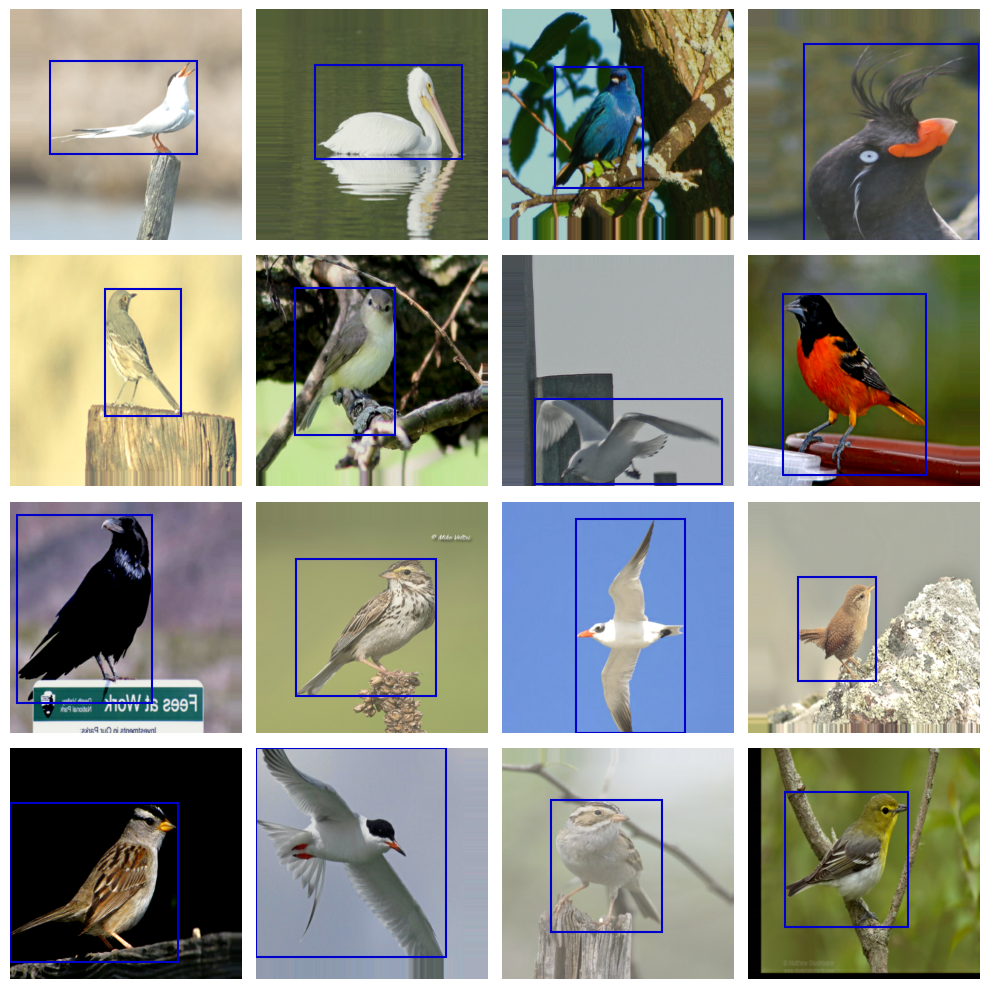

In [ ]:
# Some images from the training dataset after data augmentation
show_images(images, boxes, num_examples=16, random=False)

## **Build and Compile the Model**

To speed up the fine-tuning process, Google Colab's TPU is utilized.

In [ ]:
# TPU setup

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu="local")
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.TPUStrategy(tpu)
  print("TPU initialized:")
  print("All devices: ", tf.config.list_logical_devices("TPU"))
except (ValueError, tf.errors.InvalidArgumentError, tf.errors.NotFoundError) as error:
  print(f"Error: {error}")

TPU initialized:
All devices:  [LogicalDevice(name='/device:TPU:0', device_type='TPU'), LogicalDevice(name='/device:TPU:1', device_type='TPU'), LogicalDevice(name='/device:TPU:2', device_type='TPU'), LogicalDevice(name='/device:TPU:3', device_type='TPU'), LogicalDevice(name='/device:TPU:4', device_type='TPU'), LogicalDevice(name='/device:TPU:5', device_type='TPU'), LogicalDevice(name='/device:TPU:6', device_type='TPU'), LogicalDevice(name='/device:TPU:7', device_type='TPU')]


In [ ]:
# Function to build the model
def build_model(model_url, image_size, dropout_rate=0.1, name=None):
  inputs = tf.keras.Input(shape=image_size)

  x = hub.KerasLayer(model_url, trainable=True)(inputs)
  x = tf.keras.layers.Dropout(dropout_rate)(x)
  x = tf.keras.layers.Dense(4, activation="sigmoid")(x)
  model = tf.keras.Model(inputs=inputs, outputs=x, name=name)

  return model

In object detection, better results can be achieved by combining the standard loss for **bounding boxes** (Mean Squared Error or **MSE**) with the **GIoU** loss (Generalized Intersection over Union). GIoU is an improvement over the **IoU** (Intersection over Union) metric, which measures the overlap between the predicted and ground truth bounding boxes. While IoU only considers the common area between the two boxes, GIoU introduces an additional term that penalizes the lack of overlap, even when the boxes do not intersect. This helps improve model convergence, especially in scenarios where the predicted boxes are misaligned or fall outside the area of interest. For more details, see the following [article](https://giou.stanford.edu/GIoU.pdf).

The model's performance in predicting bounding boxes is better assessed using the IoU metric, which is calculated as the ratio of the intersection area to the union area of two boxes. Conventional accuracy is not suitable for this task. The IoU value ranges from 0 to 1, with 1 indicating a perfect match.

Below, both the **IoU** metric and **GIoU** loss are implemented using TensorFlow to improve results:

In [ ]:
@tf.function
def calculate_giou(box_true, box_pred, metric="iou"):
  # Convert the box coordinates to float32
  box_true = tf.cast(box_true, tf.float32)
  box_pred = tf.cast(box_pred, tf.float32)

  # Extract the minimum and maximum coordinates of the boxes
  ymin_true, xmin_true, ymax_true, xmax_true = tf.unstack(box_true, axis=-1)
  ymin_pred, xmin_pred, ymax_pred, xmax_pred = tf.unstack(box_pred, axis=-1)

  # Calculate the areas of the true and predicted boxes
  width_true = tf.maximum(xmax_true - xmin_true, 0)
  height_true = tf.maximum(ymax_true - ymin_true, 0)
  width_pred = tf.maximum(xmax_pred - xmin_pred, 0)
  height_pred = tf.maximum(ymax_pred - ymin_pred, 0)
  area_true = width_true * height_true
  area_pred = width_pred * height_pred

  # Calculate the intersection area
  intersect_xmin = tf.maximum(xmin_true, xmin_pred)
  intersect_ymin = tf.maximum(ymin_true, ymin_pred)
  intersect_xmax = tf.minimum(xmax_true, xmax_pred)
  intersect_ymax = tf.minimum(ymax_true, ymax_pred)
  intersect_width = tf.maximum(intersect_xmax - intersect_xmin, 0)
  intersect_height = tf.maximum(intersect_ymax - intersect_ymin, 0)
  intersect_area = intersect_width * intersect_height

  # Calculate the union area
  union_area = area_true + area_pred - intersect_area

  # Calculate IoU
  iou = tf.math.divide_no_nan(intersect_area, union_area)

  # Return IoU if required
  if metric == "iou":
    return iou

  # Calculate the area of the minimum enclosing box
  enclose_xmin = tf.minimum(xmin_true, xmin_pred)
  enclose_ymin = tf.minimum(ymin_true, ymin_pred)
  enclose_xmax = tf.maximum(xmax_true, xmax_pred)
  enclose_ymax = tf.maximum(ymax_true, ymax_pred)
  enclose_width = tf.maximum(enclose_xmax - enclose_xmin, 0)
  enclose_height = tf.maximum(enclose_ymax - enclose_ymin, 0)
  enclose_area = enclose_width * enclose_height

  # Calculate GIoU
  giou = iou - tf.math.divide_no_nan(enclose_area - union_area, enclose_area)
  return giou

In [ ]:
# Custom metric to calculate IoU
@tf.keras.utils.register_keras_serializable()
def metric_iou(box_true, box_pred):
  return tf.reduce_mean(calculate_giou(box_true, box_pred))


# Custom loss that combines MSE and GIoU for the bounding boxes
@tf.keras.utils.register_keras_serializable()
def custom_loss(box_true, box_pred):
  mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE)
  loss_mse = tf.reduce_mean(mse(box_true, box_pred))

  loss_giou = 1 - calculate_giou(box_true, box_pred, metric="giou")
  loss_giou = tf.reduce_mean(loss_giou)

  loss = 5*loss_mse + 2*loss_giou
  return loss

In [ ]:
tf.keras.backend.clear_session()

with strategy.scope():
  model = build_model(model_url, new_size, name="EfficientNetV2-S")

  model.compile(
      optimizer=tf.keras.optimizers.Adam(1e-4),
      loss=custom_loss,
      metrics=[metric_iou]
  )

model.summary()

Model: "EfficientNetV2-S"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 384, 384, 3)]     0         
                                                                 
 keras_layer (KerasLayer)    (None, 1280)              20331360  
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 4)                 5124      
                                                                 
Total params: 20336484 (77.58 MB)
Trainable params: 20182612 (76.99 MB)
Non-trainable params: 153872 (601.06 KB)
_________________________________________________________________


## **Train the Model**

In [ ]:
# Callback to stop training early if validation IoU does not improve for 5 epochs
patience = 5
callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_metric_iou",
    patience=patience,
    mode="max",
    restore_best_weights=True
)

In [ ]:
history = model.fit(train_dataset, epochs=epochs, validation_data=test_dataset, callbacks=[callback])

Epoch 1/50
187/187 [==============================] - 180s 272ms/step - loss: 1.1824 - metric_iou: 0.4972 - val_loss: 0.8427 - val_metric_iou: 0.6213
Epoch 2/50
187/187 [==============================] - 39s 204ms/step - loss: 0.7850 - metric_iou: 0.6443 - val_loss: 0.5519 - val_metric_iou: 0.7393
Epoch 3/50
187/187 [==============================] - 40s 207ms/step - loss: 0.6019 - metric_iou: 0.7197 - val_loss: 0.4048 - val_metric_iou: 0.8061
Epoch 4/50
187/187 [==============================] - 39s 205ms/step - loss: 0.5145 - metric_iou: 0.7576 - val_loss: 0.3473 - val_metric_iou: 0.8329
Epoch 5/50
187/187 [==============================] - 41s 213ms/step - loss: 0.4570 - metric_iou: 0.7832 - val_loss: 0.3063 - val_metric_iou: 0.8521
Epoch 6/50
187/187 [==============================] - 39s 205ms/step - loss: 0.4141 - metric_iou: 0.8023 - val_loss: 0.2743 - val_metric_iou: 0.8672
Epoch 7/50
187/187 [==============================] - 38s 203ms/step - loss: 0.3934 - metric_iou: 0.8117 

**Save the model**

In [ ]:
trained_model_path = "/content/drive/MyDrive/models/ObjectLocalization_EfficientNetV2-S_CUB-200-2011"
model.save(trained_model_path)

## **Model Evaluation**


In [ ]:
metrics_train = model.evaluate(train_dataset, verbose=0)
metrics_test = model.evaluate(test_dataset, verbose=0)

print(f"Train\tLoss: {metrics_train[0]}; IoU: {metrics_train[1]}")
print(f"Test\tLoss: {metrics_test[0]}; IoU: {metrics_test[1]}")

Train	Loss: 0.11572423577308655; IoU: 0.9429411888122559
Test	Loss: 0.16351047158241272; IoU: 0.9202419519424438


### **Graphs of the metrics**

In [ ]:
# Library needed to convert Plotly interactive graphics into images
!pip install kaleido -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 13.8 MB/s eta 0:00:00


In [ ]:
# Function to plot the metrics
def plot_metrics(history=history.history, renderer=None, with_patience=True):
  epochs = len(history["loss"])
  list_epochs = np.arange(1, epochs+1)
  metrics = list(history.keys())
  num_metrics = len(metrics) // 2

  for metric in metrics[:num_metrics]:
    values = history[metric]
    val_values = history[f"val_{metric}"]
    metric = "IoU" if "iou" in metric else metric.split("_")[-1].capitalize()

    fig=go.Figure()
    fig.add_trace(go.Scatter(x=list_epochs, y=values, name=metric, line=dict(color="blue", width=2)))
    fig.add_trace(go.Scatter(x=list_epochs, y=val_values, name=f"Val {metric}", line=dict(color="#FF6600", width=2)))

    if with_patience:
      fig.add_vline(
          x=epochs-patience, line=dict(color="red", width=2, dash="dash"),
          annotation_text="End of Training", annotation_position="top left",
          annotation=dict(font_size=12, font_color="red")
      )

    fig.update_xaxes(title_text="Epoch")
    fig.update_yaxes(title_text=metric)
    fig.update_layout(
        title=f"Evolution of {metric} across Epochs",
        title_font=dict(size=20),
        title_x=0.5,
        height=500,
        width=1200
    )

    fig.show(renderer)

In [ ]:
# Interactive graphic
plot_metrics()

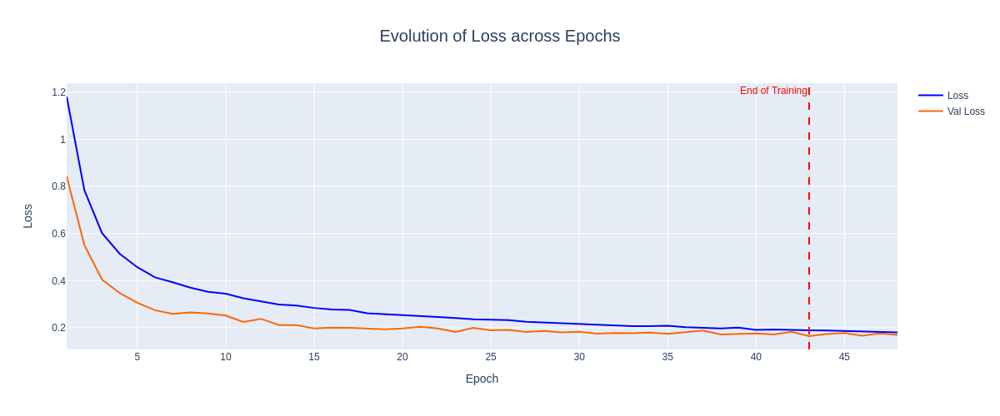

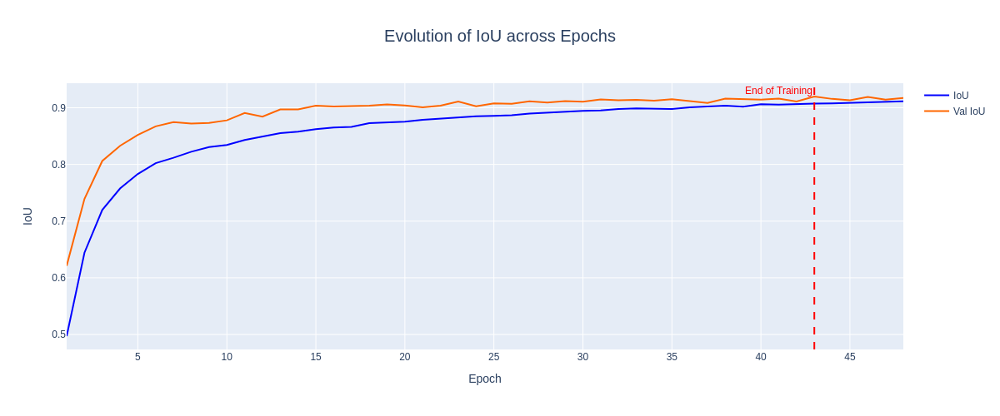

In [ ]:
# Static image for GitHub
plot_metrics(renderer="png")

### **IoU Metric**

In [ ]:
images_test = test_dataset.unbatch().map(lambda x, y: x)
images_test = np.array(list(images_test.as_numpy_iterator()))

boxes_test = test_dataset.unbatch().map(lambda x, y: y)
boxes_test = np.array(list(boxes_test.as_numpy_iterator()))

boxes_test_pred = model.predict(test_dataset)

181/181 [==============================] - 18s 35ms/step


In [ ]:
iou_test = calculate_giou(boxes_test, boxes_test_pred).numpy()

print("Mean IoU:", iou_test.mean())
print("Min IoU:", iou_test.min())
print("Max IoU:", iou_test.max())
print(f"Percentage of detections with IoU >= 0.5: {np.mean(iou_test >= 0.5) * 100:.2f}%")
print(f"Percentage of detections with IoU >= 0.75: {np.mean(iou_test >= 0.75) * 100:.2f}%")
print(f"Percentage of detections with IoU >= 0.9: {np.mean(iou_test >= 0.9) * 100:.2f}%")

Mean IoU: 0.9202421
Min IoU: 0.21756513
Max IoU: 0.99728465
Percentage of detections with IoU >= 0.5: 99.67%
Percentage of detections with IoU >= 0.75: 97.19%
Percentage of detections with IoU >= 0.9: 76.86%


## **Predictions on the Test Dataset**

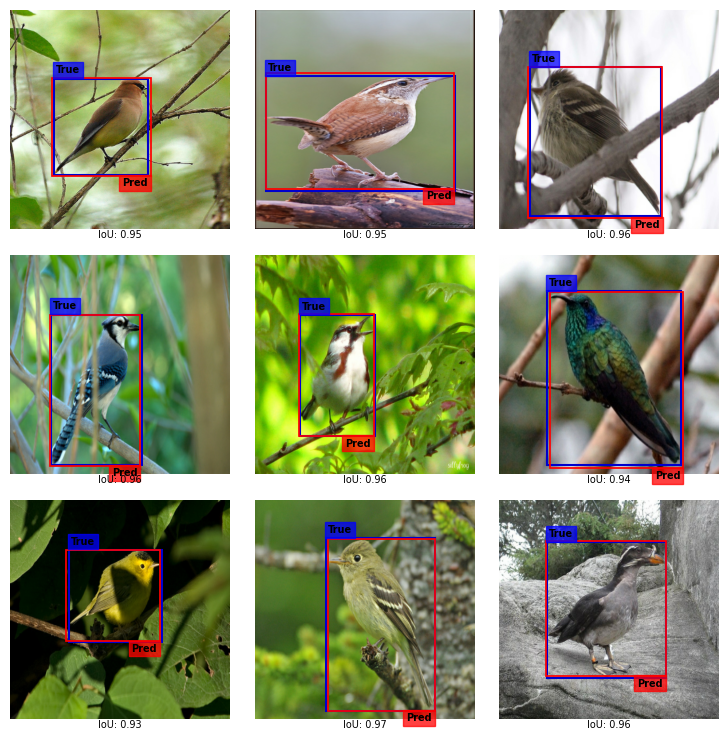

In [ ]:
show_images(images_test, boxes_test, boxes_test_pred)

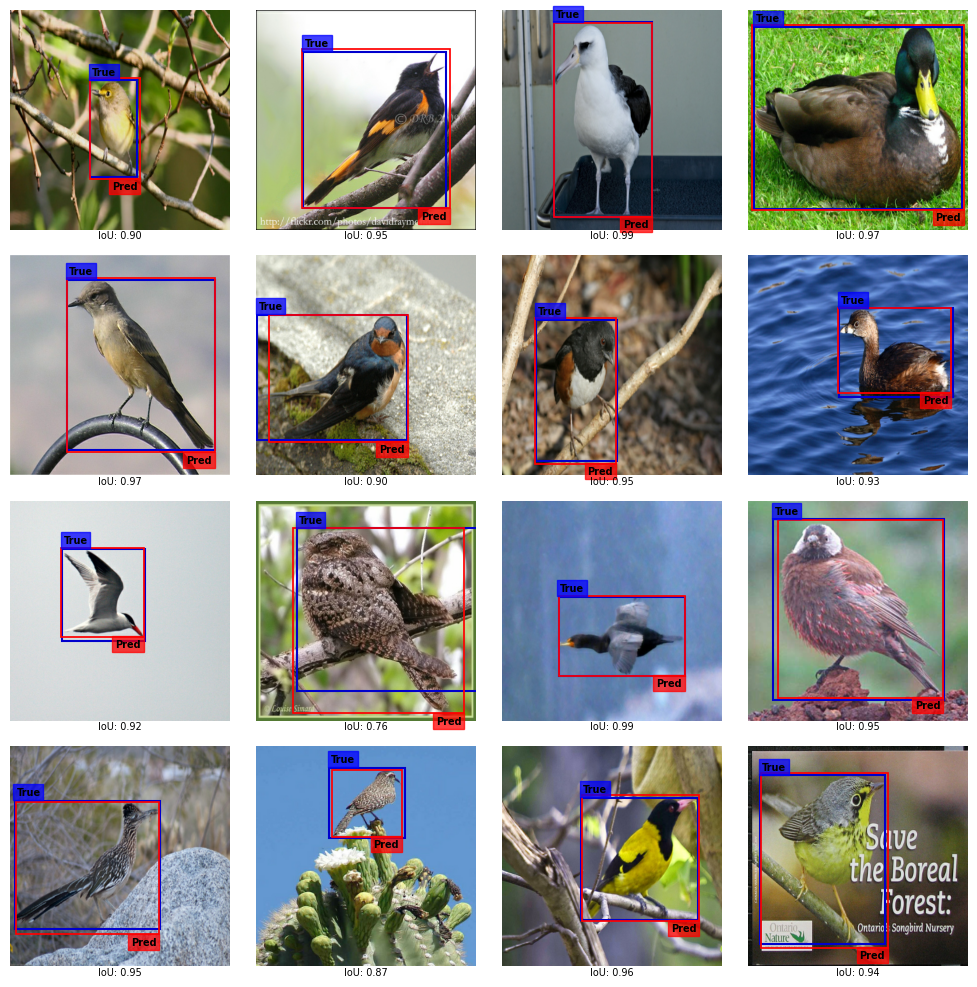

In [ ]:
show_images(images_test, boxes_test, boxes_test_pred, num_examples=16, random=False)

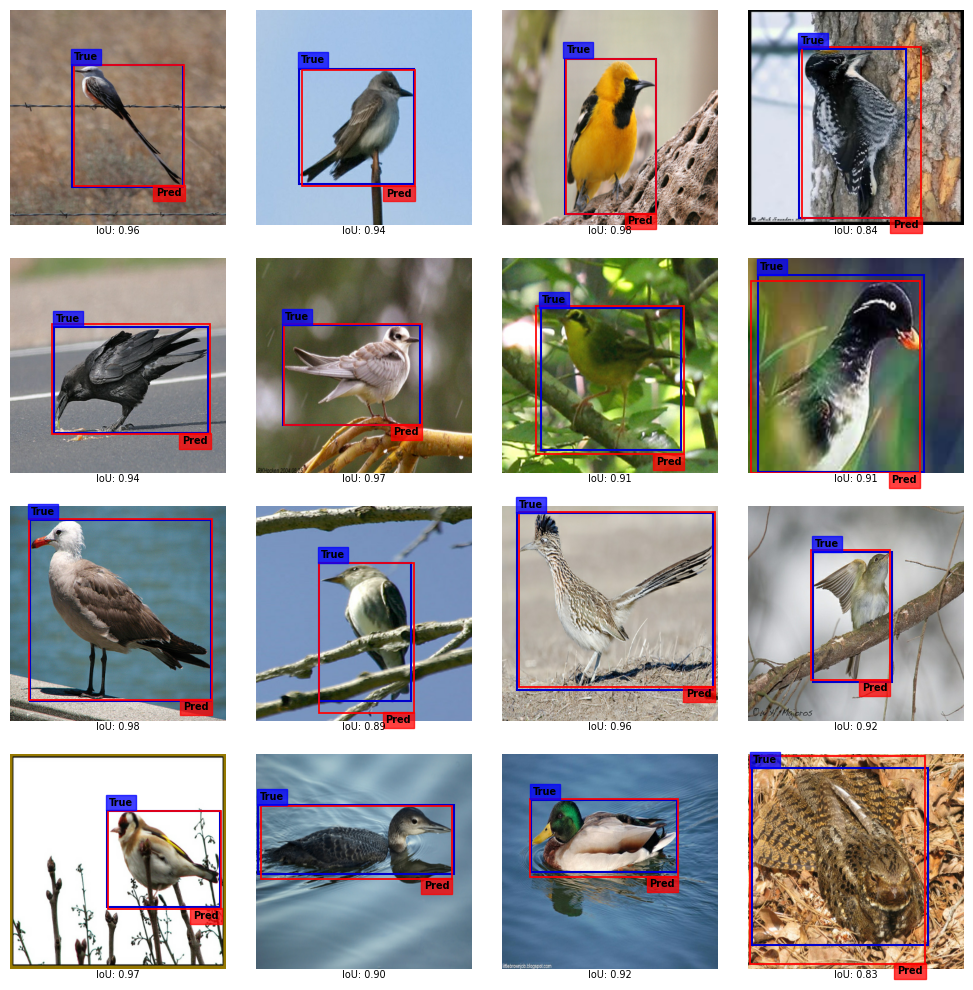

In [ ]:
show_images(images_test, boxes_test, boxes_test_pred, num_examples=16)

**Bounding boxes with IoU less than 0.5**

It can be observed that there are only 19 predictions where the IoU between the actual and predicted bounding boxes is less than 0.5. Additionally, some annotation errors are evident, where the predicted bounding boxes correctly enclose the bird, but the actual ones do not. This results in the average IoU of the test dataset being slightly lower than it should be.

In [1]:
indices = np.where(iou_test < 0.5)[0]
indices.shape

(19,)

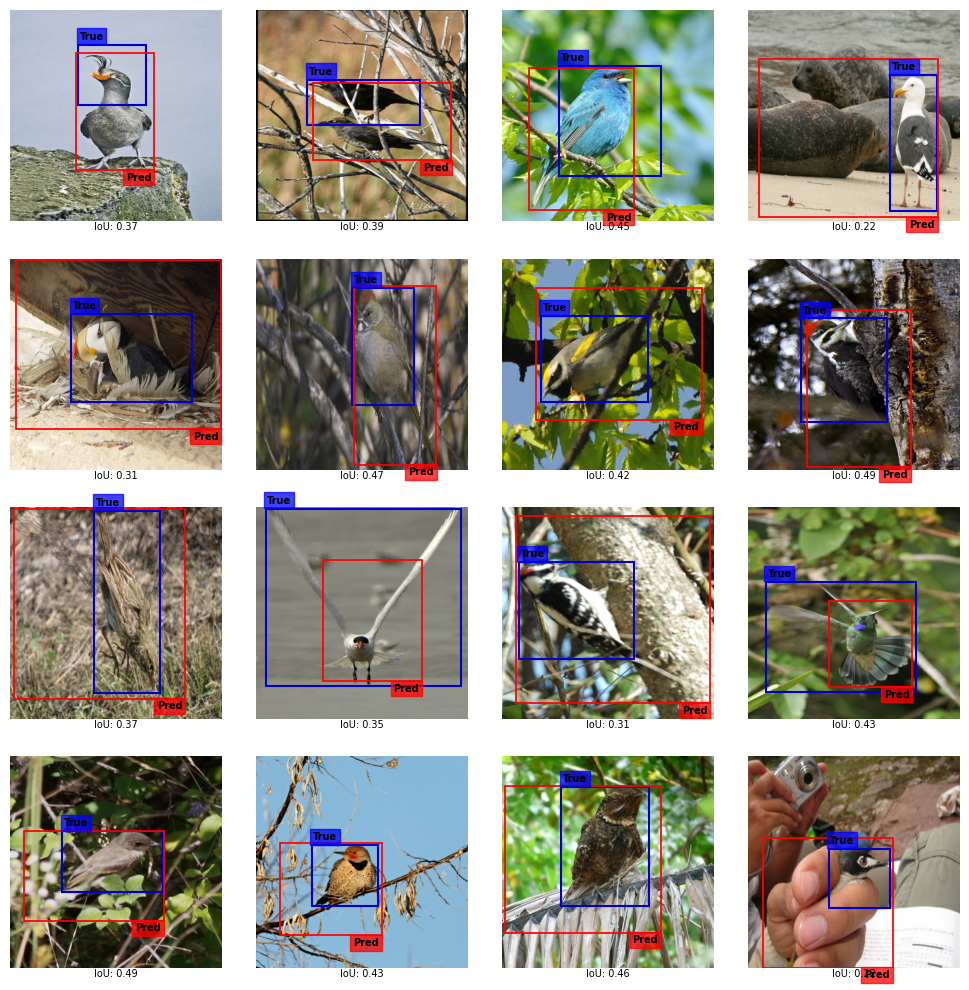

In [ ]:
show_images(
    images_test[indices], boxes_test[indices], boxes_test_pred[indices],
    num_examples=16, random=False
)

**Bounding boxes with IoU greater than or equal to 0.99**

In [2]:
indices = np.where(iou_test >= 0.99)[0]
indices.shape

(18,)

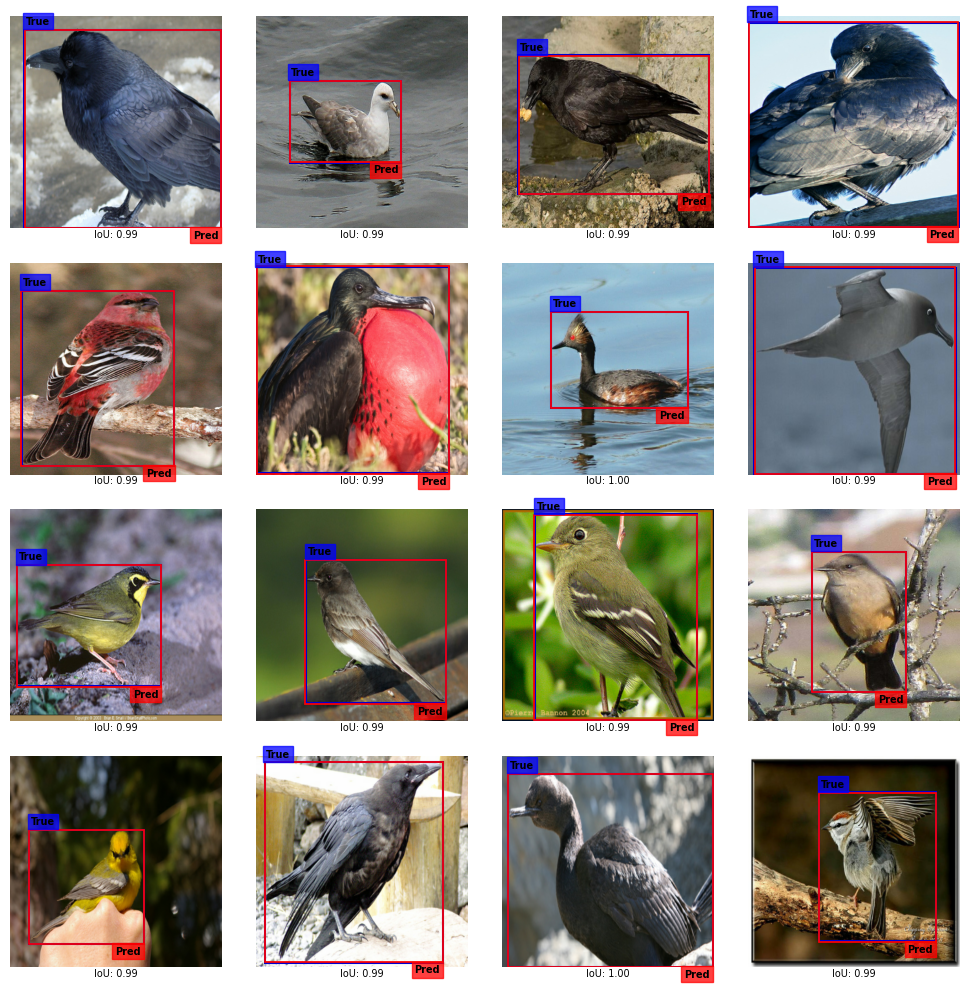

In [ ]:
show_images(
    images_test[indices][::-1], boxes_test[indices][::-1], boxes_test_pred[indices][::-1],
    num_examples=16, random=False
)

## **Object Detection**

In [ ]:
# Paths for the fine-tuned object classification and localization model
path_model_ic = "/content/drive/MyDrive/models/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird"
path_model_ol = "/content/drive/MyDrive/models/ObjectLocalization_EfficientNetV2-S_CUB-200-2011"

In [ ]:
# Image classification model
tf.keras.backend.clear_session()

model_ic = TFAutoModelForImageClassification.from_pretrained(path_model_ic)
model_ic.summary()

All model checkpoint layers were used when initializing TFConvNextV2ForImageClassification.

All the layers of TFConvNextV2ForImageClassification were initialized from the model checkpoint at /content/drive/MyDrive/models/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFConvNextV2ForImageClassification for predictions without further training.


Model: "tf_conv_next_v2_for_image_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 convnextv2 (TFConvNextV2Ma  multiple                  196419840 
 inLayer)                                                        
                                                                 
 classifier (Dense)          multiple                  307400    
                                                                 
Total params: 196727240 (750.45 MB)
Trainable params: 196727240 (750.45 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Download the image processor for the classification model
image_processor = AutoImageProcessor.from_pretrained("facebook/convnextv2-large-22k-384")
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 384
  }
}

In [ ]:
# Object localization model
model_ol = tf.keras.models.load_model(path_model_ol)
model_ol.summary()

Model: "EfficientNetV2-S"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 384, 384, 3)]     0         
                                                                 
 keras_layer (KerasLayer)    (None, 1280)              20331360  
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 4)                 5124      
                                                                 
Total params: 20336484 (77.58 MB)
Trainable params: 20182612 (76.99 MB)
Non-trainable params: 153872 (601.06 KB)
_________________________________________________________________


In [ ]:
# Function for detecting birds from the internet
def bird_detection_url(list_urls, save=False, path_save=""):
  n = int(np.sqrt(len(list_urls)))

  # Download the images and convert them to NumPy arrays.
  images = []

  for url in list_urls:
    path = tf.keras.utils.get_file(origin=url)
    image = tf.keras.utils.load_img(path)
    images.append(np.array(image))

  # Predict the classes and logits of the images
  inputs_ic = image_processor(images, return_tensors="tf")
  pred_labels = model_ic(**inputs_ic).logits
  pred_labels = tf.nn.softmax(pred_labels, axis=-1)
  logits = tf.reduce_max(pred_labels, axis=-1)
  pred_labels = tf.argmax(pred_labels, axis=-1)
  pred_labels = class_names[pred_labels]

  # Predict the coordinates of the bounding boxes
  inputs_ol = tf.stack([tf.image.resize(image, new_size[:-1]) for image in images])
  inputs_ol = inputs_ol / 255
  pred_boxes = model_ol.predict(inputs_ol, verbose=0)

  fig, axes = plt.subplots(n, n, figsize=(3.5*n, 3.5*n))

  for i, ax in enumerate(axes.flat):
    image = images[i]
    shape = image.shape
    label = pred_labels[i]
    logit = logits[i]
    box = pred_boxes[i]

    ax.imshow(image)

    ymin, xmin, ymax, xmax = tuple(box)
    ymin, ymax = ymin*shape[0], ymax*shape[0]
    xmin, xmax = xmin*shape[1], xmax*shape[1]
    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.5, edgecolor="mediumblue", facecolor="none")
    ax.add_patch(rect)

    ax.text(
        x=xmin+shape[1]*0.007, y=ymin-shape[0]*0.013, s=f"{label}:  {logit*100:.1f}%",
        color="black", fontsize=7, fontweight="bold", ha="left", va="bottom",
        bbox={"boxstyle":"square", "facecolor": "blue", "edgecolor":"blue", "alpha":0.7}
    )

    ax.axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

In [ ]:
list_urls = [
    "https://www.sdakotabirds.com/species_photos/flycatchers/least_flycatcher_8.jpg",
    "https://www.eopugetsound.org/sites/default/files/topical_article/images/28777858956_350d7b5be5_b_0.jpg",
    "https://media.audubon.org/nas_birdapi_hero/eastern-whip-poor-will_005_shutterstock_1219487134.jpg",
    "https://smallsensorphotography.com/wordpress/wp-content/uploads/2023/05/4090193_DxO3909wprocapH1200.jpg",

    "https://live.staticflickr.com/65535/47057120154_e3fa046c41_b.jpg",
    "https://media01.stockfood.com/largepreviews/MjIwMjU5MTU0MA==/71051340-Cape-Starling-Cape-Glossy-Starling-Lamprotornis-nitens-a-species-of-starling-in-the-Sturnidae-family-South.jpg",
    "https://feathersandflora.com/wp-content/uploads/2018/05/0e4a7678.jpg?w=1400",
    "https://climate2014.audubon.org/sites/default/files/styles/focal_bird_engagement/public/bird_images/Bohemian_Waxwing_DanielArndt_FlickrCCWEB.jpg?itok=Xqe_LlNK",
    "https://images.naturephotographers.network/optimized/3X/7/3/732567f473e07f5d310536879f258a1c55f3ec76_2_1024x682.jpeg",
    "https://www.eekwi.org/sites/default/files/whitepelicanflight.jpg",
    "https://i.pinimg.com/736x/83/a6/75/83a6755b34404cc4b833c13dee4e28e0.jpg",
    "https://i.natgeofe.com/n/1f45fd34-a2e9-4f00-a1c5-fffc699f2482/STOCK_DEPARTMETNS_2211_BI_naturepl_01517886.jpg",
    "https://i.pinimg.com/564x/f9/5d/d2/f95dd2a1ea8ce6fe90c61472576eb451.jpg",

    "https://tgreybirds.com/PelagicCormorant09.jpg",
    "https://cdn.download.ams.birds.cornell.edu/api/v1/asset/303379871/320",
    "https://lostcoastoutpost.com/loco-media/loco-media/taxa/observationphoto/442/original.webp",
    "https://www.mediastorehouse.com.au/p/467/great-tailed-grackle-quiscalus-mexicanus-13977938.jpg.webp",
    "https://objects.liquidweb.services/images/201407/frode_jacobsen_7467757054_98545d8fdf_z.jpg",
    "https://www.oiseaux-birds.com/passeriformes/fringillides/durbec-des-sapins/durbec-des-sapins-iw5.jpg",
    "https://www.sdakotabirds.com/species_photos/warblers/american_redstart_16.jpg",
    "https://cdn.firespring.com/images/3aca91b5-d451-47c6-8283-6e918937c6ee.jpg",
    "https://images.squarespace-cdn.com/content/v1/543e7367e4b0f38ea790072b/1454429704411-DTDBTPDXXEH107770RMM/image-asset.jpeg",
]

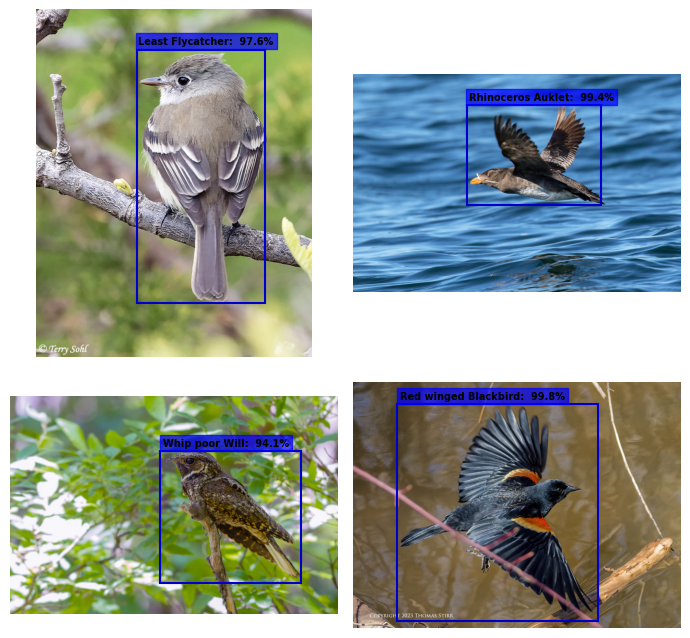

In [ ]:
bird_detection_url(list_urls[:4])

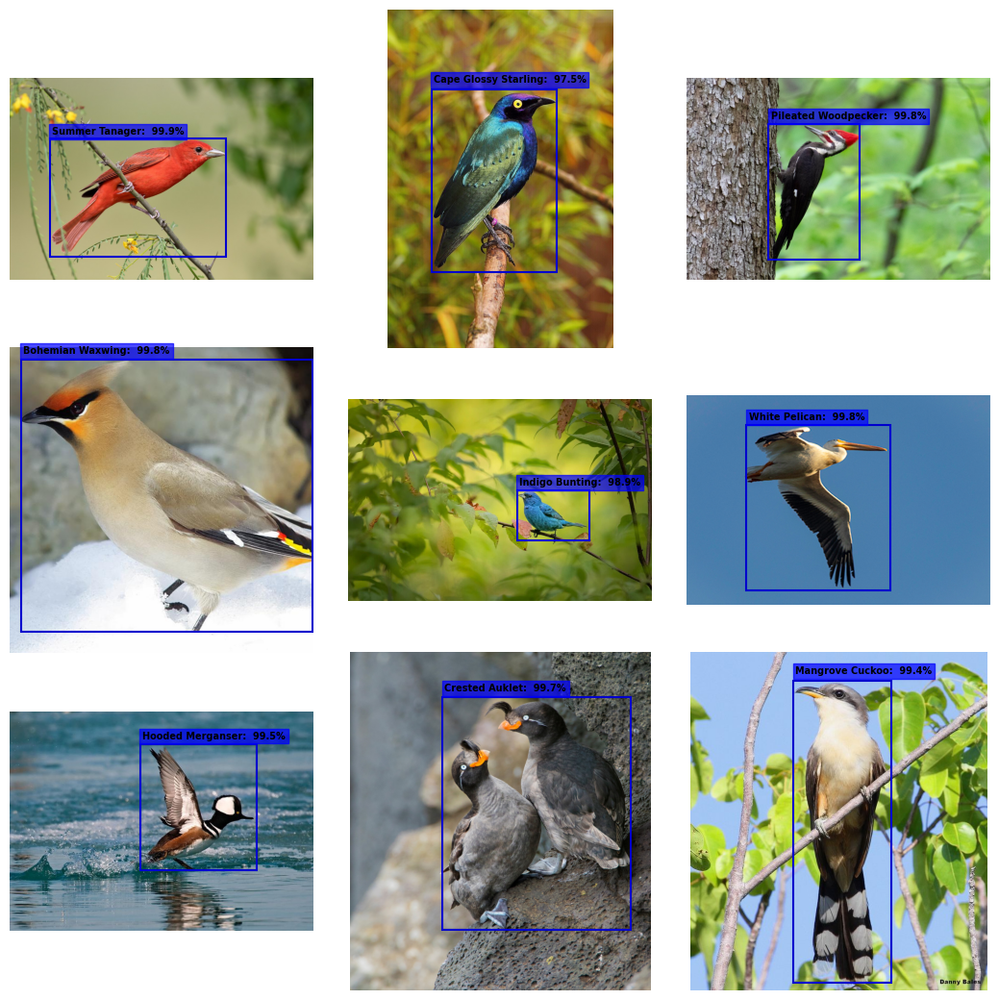

In [ ]:
bird_detection_url(list_urls[4:13], save=True, path_save="ObjectDetection_EfficientNetV2S_CUB-200-2011.png")

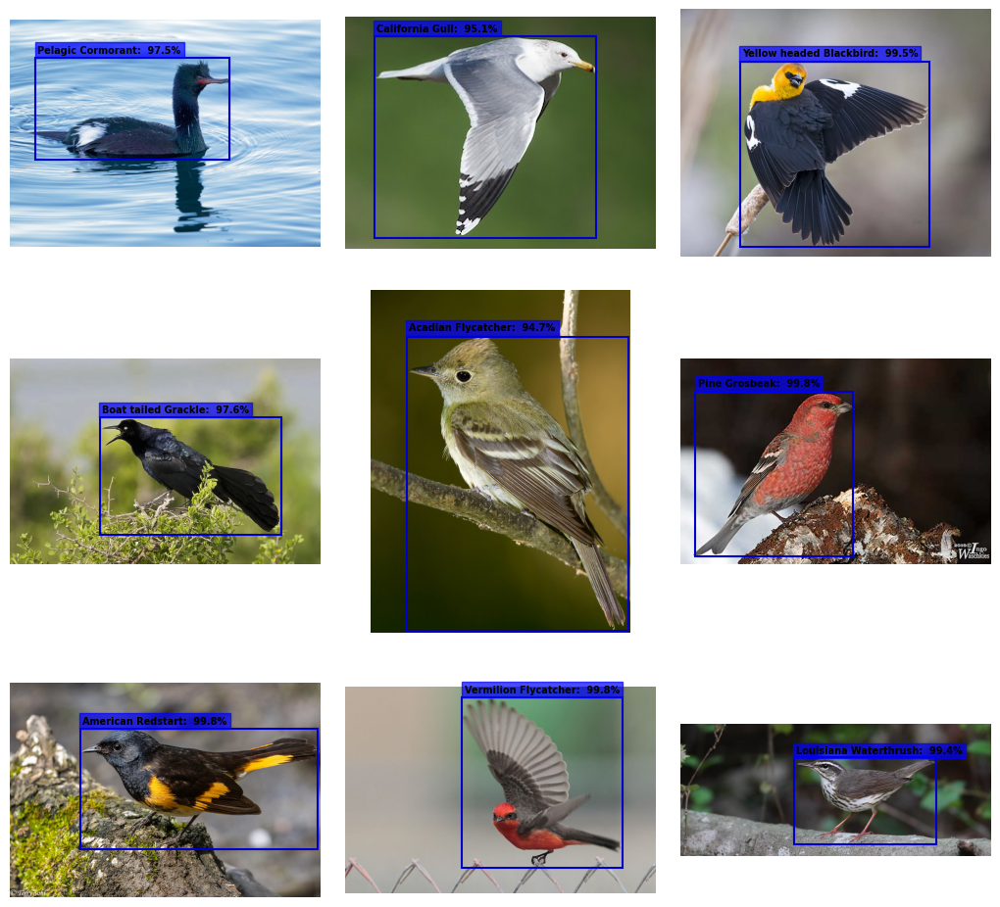

In [ ]:
bird_detection_url(list_urls[13:])

**Conclusion:** The fine-tuned model achieved outstanding results, with an **average IoU** of **0.9429** on the **training dataset** and an **average IoU** of **0.9202** on the **test dataset**. Despite the small size of the training dataset, only slight overfitting is observed, thanks to the implementation of the dropout layer and the use of the early stopping callback. Furthermore, the evaluation shows that 99.67% of the predictions have an IoU greater than 0.5, nearly reaching 100%. Additionally, 97.19% of the predictions exhibit an IoU above 0.75, indicating that the model is highly effective. This success can be attributed to the use of the GIoU loss function combined with MSE, as well as the comprehensive implementation developed in this notebook.

To achieve even better results, it would be advisable to utilize larger versions of EfficientNetV2, such as the ``L`` or ``XL`` versions. However, this would require additional images of birds belonging to the 200 species in the CUB-200-2011 dataset, along with their respective bounding boxes.